## Note to the Reader

1) To keep this explainer notebook as clean and readable as possible, several longer Python functions have been moved to separate files located in the `/utilities` folder.



2) Our full project, including code and website source code, is publicly available on GitHub:
`https://github.com/Andreas-Holm-2/02467-Project-assignment`

3) The datasets used in this project can be accessed here:


*Spotify Artist Collaboration Network (Large Dataset):*

- `https://www.kaggle.com/datasets/jfreyberg/spotify-artist-feature-collaboration-network?resource=download&fbclid=IwZXh0bgNhZW0CMTEAAR5jxk4FClm9GBFvCklV4Ga5SRwON3ajfqLdOMjFqN1uereEEduffCtjEbkjJg_aem_YUf8t7fIjwbCWiHS_vrVc`

*US Top 10K Artists and Their Popular Songs (Smaller Dataset):*

`https://www.kaggle.com/datasets/spoorthiuk/us-top-10k-artists-and-their-popular-songs`

## Motivation 

As music plays a significant role in most people’s lives—including our own—it was naturally intriguing for us to explore this domain. The goal of this project is to investigate whether there are any significant differences in the way artists within different music genres collaborate. More specifically, we were interested in examining whether collaboration patterns differ between the two highly collaborative genres: pop and rap. We hypothesize that these patterns do indeed vary, and we aim to explore what this reveals about the culture within each genre. We believe that network science is the perfect tool to help us answer this question.

In this project, we constructed our own dataset by utilizing two different sources. The first was a large dataset containing approximately 156,000 artists and recorded collaborations between them. We found this dataset ideal for our project, as it included the key features we needed: artist names, follower counts (allowing us to filter out smaller or duplicate artists), and genre labels (enabling us to compare genres within the network).

In addition, we used a smaller dataset containing a list of the 10,000 most listened-to artists within the US. This dataset allowed us to narrow our analytical focus, excluding less influential or smaller artists. We intersected this list with the larger dataset to retain only relevant artists. Various additional preprocessing steps were employed to ensure a clean and usable dataset, which are described further below.

Our datasets did not naturally contain any text-data. To address this, we used our knowledge from class to leverage the Genius API in order to collect lyrics for each artist. Our approach was to gather lyrics from each artist’s three most popular songs, as these are typically the best representations of their musical style and identity.

In [1]:
# Import of the most central dependicies
import pandas as pd
import matplotlib.pyplot as plt
import ast
import networkx as nx
import community as community_louvain
from collections import Counter, defaultdict
import netwulf as nw
import numpy as np
import re
from langdetect import detect, DetectorFactory
DetectorFactory.seed = 0 
from nltk.stem import SnowballStemmer
from nltk.corpus import stopwords
from nltk.collocations import BigramCollocationFinder
from nltk.metrics import BigramAssocMeasures
from scipy.stats import chi2
from nltk.tokenize import MWETokenizer
from wordcloud import WordCloud
import math
import pickle 

import sys
sys.dont_write_bytecode = True

## Loading the datasets

In [2]:
# Spotify Artist Collaboration Network (Large Dataset)
nodes_df = pd.read_csv('nodes.csv')
edges_df = pd.read_csv('edges.csv')
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])
nodes_df

,spotify_id,name,followers,popularity,genres,chart_hits
0,48WvrUGoijadXXCsGocwM4,Byklubben,1738.0,24,"[nordic house, russelater]",['no (3)']
1,4lDiJcOJ2GLCK6p9q5BgfK,Kontra K,1999676.0,72,"[christlicher rap, german hip hop]","['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ..."
2,652XIvIBNGg3C0KIGEJWit,Maxim,34596.0,36,[],['de (1)']
3,3dXC1YPbnQPsfHPVkm1ipj,Christopher Martin,249233.0,52,"[dancehall, lovers rock, modern reggae, reggae...","['at (1)', 'de (1)']"
4,74terC9ol9zMo8rfzhSOiG,Jakob Hellman,21193.0,39,"[classic swedish pop, norrbotten indie, swedis...",['se (6)']
...,...,...,...,...,...,...
156417,2ces6d2YsQP1RpGMYpdFy8,David Urwitz,5470.0,29,[classic swedish pop],NaN
156418,6AeznZajNbXUulT7W4tK5l,Darmiko,2022.0,23,[],NaN
156419,3GEijIjrgb4lPe9WtURBzz,Katriell,268.0,0,[],NaN
156420,0ldQL0icSoMz9OOZcWG8Zt,Yung Fresh,181.0,19,[],NaN


In [3]:
# US Top 10K Artists:
artists_us_df = pd.read_csv("most_listened_artists_in_US_dataset.csv", index_col=0)
artists_us_df

,ID,Gender,Age,Country,Genres,Popularity,Followers,URI
Name,,,,,,,,
Drake,3TVXtAsR1Inumwj472S9r4,male,33,CA,"['canadian hip hop', 'canadian pop', 'hip hop'...",95,83298497,spotify:artist:3TVXtAsR1Inumwj472S9r4
Post Malone,246dkjvS1zLTtiykXe5h60,male,25,US,"['dfw rap', 'melodic rap', 'pop', 'rap']",86,43130108,spotify:artist:246dkjvS1zLTtiykXe5h60
Ed Sheeran,6eUKZXaKkcviH0Ku9w2n3V,male,29,GB,"['pop', 'singer-songwriter pop', 'uk pop']",87,115998928,spotify:artist:6eUKZXaKkcviH0Ku9w2n3V
J Balvin,1vyhD5VmyZ7KMfW5gqLgo5,male,35,CO,"['reggaeton', 'reggaeton colombiano', 'trap la...",83,38028010,spotify:artist:1vyhD5VmyZ7KMfW5gqLgo5
Bad Bunny,4q3ewBCX7sLwd24euuV69X,male,26,PR,"['reggaeton', 'trap latino', 'urbano latino']",95,77931484,spotify:artist:4q3ewBCX7sLwd24euuV69X
...,...,...,...,...,...,...,...,...
IVAN$ITO,0cPmSFfjpop7imPVWSk2yc,NaN,0,NaN,[],20,4249,spotify:artist:0cPmSFfjpop7imPVWSk2yc
Antonello Venditti,3hYLJPJuDyblFKersEaFd6,male,71,IT,"[""canzone d'autore"", 'classic italian pop', 'i...",54,778642,spotify:artist:3hYLJPJuDyblFKersEaFd6
Lea Salonga,1GlMjIezcLwV3OFlX0uXOv,female,49,PH,"['movie tunes', 'tagalog worship']",56,179832,spotify:artist:1GlMjIezcLwV3OFlX0uXOv


In [4]:
artists_us_name_list = (artists_us_df.index).tolist() # Convert the list of names into list allowing us to find the intersection next
print(artists_us_name_list[:5]) # Security check

['Drake', 'Post Malone', 'Ed Sheeran', 'J Balvin', 'Bad Bunny']


## Finding the intersection betwen the two datasets

We will now be constructing our dataset as a intersection between the large spotify collaration dataset and `artists_us_name_list`

In [5]:
nodes_df = nodes_df[nodes_df["name"].isin(artists_us_name_list)]
nodes_df

,spotify_id,name,followers,popularity,genres,chart_hits
0,48WvrUGoijadXXCsGocwM4,Byklubben,1738.0,24,"[nordic house, russelater]",['no (3)']
1,4lDiJcOJ2GLCK6p9q5BgfK,Kontra K,1999676.0,72,"[christlicher rap, german hip hop]","['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ..."
15,3xs0LEzcPXtgNfMNcHzLIP,Rockwell,40344.0,58,[],"['us (1)', 'gb (1)', 'at (1)', 'be (1)', 'ca (..."
20,2NUz5P42WqkxilbI8ocN76,Vybz Kartel,1026598.0,63,"[dancehall, jamaican dancehall, reggae fusion]","['cr (3)', 'pa (1)']"
22,4Lm0pUvmisUHMdoky5ch2I,Apocalyptica,864846.0,60,"[alternative metal, bow pop, cello, finnish me...",['fi (2)']
...,...,...,...,...,...,...
156038,7p5J8SfKU9Rulp7tcA53G8,Jose Merce,182186.0,51,"[cante flamenco, flamenco, nuevo flamenco, rumba]",NaN
156119,3gJ0f9ov2Vjrbo9RnFFH76,Endor,267.0,2,[scottish indie folk],NaN
156199,7mKmqnXqn1WoEFljKyvAHR,2T FLOW,20.0,29,[],NaN
156220,6kT18gnkVrCz8xJQcrib7L,Bhaskar,230894.0,60,"[brazilian bass, brazilian edm, brazilian house]",NaN


By inspecting the dataframe, we notice there are more artists in the intersection (9,754) than in the dataset containing the most listened artists in the US (9,488). This indicates there are duplicates in the dataset. We will inspect this:

In [6]:
# Sorting for duplicated within the intersection
duplicate_names = nodes_df[nodes_df.duplicated(subset="name", keep=False)].sort_values(by="name")
duplicate_names

,spotify_id,name,followers,popularity,genres,chart_hits
43592,1ItNxpDdetHb2gyS10HKfF,18 Karat,1644.0,18,[],NaN
13282,5oWFxbBrbk2Mw86PLUg3OZ,18 Karat,292544.0,53,"[deep german hip hop, german hip hop, german u...","['at (16)', 'de (30)', 'lu (3)', 'ch (12)']"
57139,09ZUMxxU5pgzUF0FtHeGXG,19HUNNID,5.0,1,[],NaN
59493,2Zm4abMQXwcrsM9IWY3AoB,19HUNNID,513.0,31,[thai trap],NaN
156199,7mKmqnXqn1WoEFljKyvAHR,2T FLOW,20.0,29,[],NaN
...,...,...,...,...,...,...
146823,1wEQjEpK6KfE9Et2ZZBfPa,Żabson,43.0,4,[],NaN
24780,0FtUnl4AjR5eDa1v77WU0b,ปู่จ๋าน ลองไมค์,138.0,17,[],NaN
95174,23YWwPEvaO5HLqEMgiUXJa,ปู่จ๋าน ลองไมค์,23424.0,32,[],NaN
6081,3dTgjg7lzUGiD3NwcGCK1n,阿冗,44494.0,48,"[chinese viral pop, mainland chinese pop]","['my (1)', 'sg (1)', 'tw (4)']"


As evident from our dataset, there are a significant number of duplicate artist names. This is primarily due to the scale of the Spotify dataset, which contains over 156,000 artists. Another contributing factor is that Spotify does not enforce unique artist names—meaning multiple users, including lesser-known or negligible artists, can share the same name.

For example, take the artist name Drake, which belongs to one of the most popular artists on the platform. However, because names on Spotify are not unique, a relatively unknown user could also appear under the name Drake, causing confusion and leading to duplicates in our dataset.

To resolve this, we implement a simple disambiguation method: for each duplicated name, we retain only the artist with the highest number of Spotify followers, assuming this is the most prominent and relevant entry.

In [7]:
final_cleaned_nodes_df = nodes_df.sort_values("followers", ascending=False)
final_cleaned_nodes_df = nodes_df.drop_duplicates(subset="name", keep="first")
final_cleaned_nodes_df

,spotify_id,name,followers,popularity,genres,chart_hits
0,48WvrUGoijadXXCsGocwM4,Byklubben,1738.0,24,"[nordic house, russelater]",['no (3)']
1,4lDiJcOJ2GLCK6p9q5BgfK,Kontra K,1999676.0,72,"[christlicher rap, german hip hop]","['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ..."
15,3xs0LEzcPXtgNfMNcHzLIP,Rockwell,40344.0,58,[],"['us (1)', 'gb (1)', 'at (1)', 'be (1)', 'ca (..."
20,2NUz5P42WqkxilbI8ocN76,Vybz Kartel,1026598.0,63,"[dancehall, jamaican dancehall, reggae fusion]","['cr (3)', 'pa (1)']"
22,4Lm0pUvmisUHMdoky5ch2I,Apocalyptica,864846.0,60,"[alternative metal, bow pop, cello, finnish me...",['fi (2)']
...,...,...,...,...,...,...
155870,3a9qv6NLHnsVxJUtKOMHvD,The Glitch Mob,538974.0,61,"[edm, electro house, glitch, glitch hop, indie...",NaN
156036,7dh6G6qILmRpUtZU4ZSD4D,Trobeats,515.0,9,[],NaN
156038,7p5J8SfKU9Rulp7tcA53G8,Jose Merce,182186.0,51,"[cante flamenco, flamenco, nuevo flamenco, rumba]",NaN
156220,6kT18gnkVrCz8xJQcrib7L,Bhaskar,230894.0,60,"[brazilian bass, brazilian edm, brazilian house]",NaN


Now, as we can see the intersection contains only 8756 rows (before 9754), meaning we succesfully removed 998 duplicate artists with the least amount of followers. We have now reached our final desired dataset.

## Functions for constructing the desired networks:

The two dataframes are constructed with 

In [8]:
from utilities.Network_construction_functions import split_artists_by_primary_genre

pop_df, rap_df = split_artists_by_primary_genre(final_cleaned_nodes_df, ["pop", "rap"])

print(f'There are {len(pop_df)} artists in the constructed pop network')
print(f'There are {len(rap_df)} artists in the constructed rap network')

There are 4161 artists in the constructed pop network
There are 1149 artists in the constructed rap network


In [9]:
from utilities.Network_construction_functions import get_Graph_with_names
print("---- Large Pop network: ----")
G_pop = get_Graph_with_names(pop_df, edges_df)
print("\n---- Large Rap network: ----")
G_rap = get_Graph_with_names(rap_df, edges_df)

---- Large Pop network: ----
Number of nodes: 4161
Number of edges: 13698
Network density: 0.0015826909211912818

---- Large Rap network: ----
Number of nodes: 1149
Number of edges: 6860
Network density: 0.010401409497123692


In [10]:
from utilities.Network_construction_functions import print_top_collaborators

print_top_collaborators(G_rap, 5)

Top 5 artists with the most collaborations:
1. Gucci Mane — 104 collaborations
2. French Montana — 99 collaborations
3. Future — 98 collaborations
4. Young Thug — 95 collaborations
5. Lil Wayne — 93 collaborations


In [11]:
print(print_top_collaborators(G_pop, 5))

Top 5 artists with the most collaborations:
1. R3HAB — 162 collaborations
2. David Guetta — 125 collaborations
3. Tiësto — 113 collaborations
4. Steve Aoki — 102 collaborations
5. Diplo — 88 collaborations
None


In [12]:
from utilities.Network_construction_functions import apply_louvain

communities = apply_louvain(G_rap, seed=20) # This function prints the communities by decending size
largest_community_id = communities[0][0]

['Community 1: 349 nodes', 'Community 2: 191 nodes', 'Community 0: 88 nodes', 'Community 8: 78 nodes', 'Community 4: 65 nodes', 'Community 30: 51 nodes', 'Community 3: 46 nodes', 'Community 18: 27 nodes', 'Community 60: 26 nodes', 'Community 32: 15 nodes', 'Community 14: 14 nodes', 'Community 31: 14 nodes', 'Community 27: 10 nodes', 'Community 12: 8 nodes', 'Community 104: 4 nodes', 'Community 25: 3 nodes', 'Community 92: 3 nodes', 'Community 35: 2 nodes', 'Community 40: 2 nodes', 'Community 47: 2 nodes', 'Community 56: 2 nodes', 'Community 73: 2 nodes', 'Community 103: 2 nodes', 'Community 107: 2 nodes', 'Community 6: 1 nodes', 'Community 7: 1 nodes', 'Community 9: 1 nodes', 'Community 10: 1 nodes', 'Community 13: 1 nodes', 'Community 15: 1 nodes', 'Community 16: 1 nodes', 'Community 19: 1 nodes', 'Community 20: 1 nodes', 'Community 21: 1 nodes', 'Community 22: 1 nodes', 'Community 26: 1 nodes', 'Community 28: 1 nodes', 'Community 29: 1 nodes', 'Community 33: 1 nodes', 'Community 36: 

In [13]:
from utilities.Network_construction_functions import apply_louvain

communities = apply_louvain(G_pop, seed=20) # This function prints the communities by decending size
largest_community_id = communities[0][0]

['Community 1: 953 nodes', 'Community 6: 388 nodes', 'Community 9: 333 nodes', 'Community 2: 172 nodes', 'Community 16: 156 nodes', 'Community 0: 152 nodes', 'Community 18: 144 nodes', 'Community 25: 139 nodes', 'Community 53: 135 nodes', 'Community 13: 134 nodes', 'Community 3: 124 nodes', 'Community 15: 119 nodes', 'Community 39: 63 nodes', 'Community 4: 56 nodes', 'Community 27: 50 nodes', 'Community 19: 41 nodes', 'Community 59: 32 nodes', 'Community 7: 26 nodes', 'Community 48: 10 nodes', 'Community 87: 10 nodes', 'Community 58: 9 nodes', 'Community 215: 7 nodes', 'Community 246: 7 nodes', 'Community 332: 7 nodes', 'Community 79: 6 nodes', 'Community 160: 6 nodes', 'Community 49: 5 nodes', 'Community 188: 5 nodes', 'Community 477: 5 nodes', 'Community 111: 4 nodes', 'Community 134: 4 nodes', 'Community 151: 4 nodes', 'Community 179: 4 nodes', 'Community 287: 4 nodes', 'Community 419: 4 nodes', 'Community 37: 3 nodes', 'Community 54: 3 nodes', 'Community 275: 3 nodes', 'Community 3

## Visualzing the networks with `Netwulf`

We will visualize each of the networks with their Louvain splits colored.

### Pop network

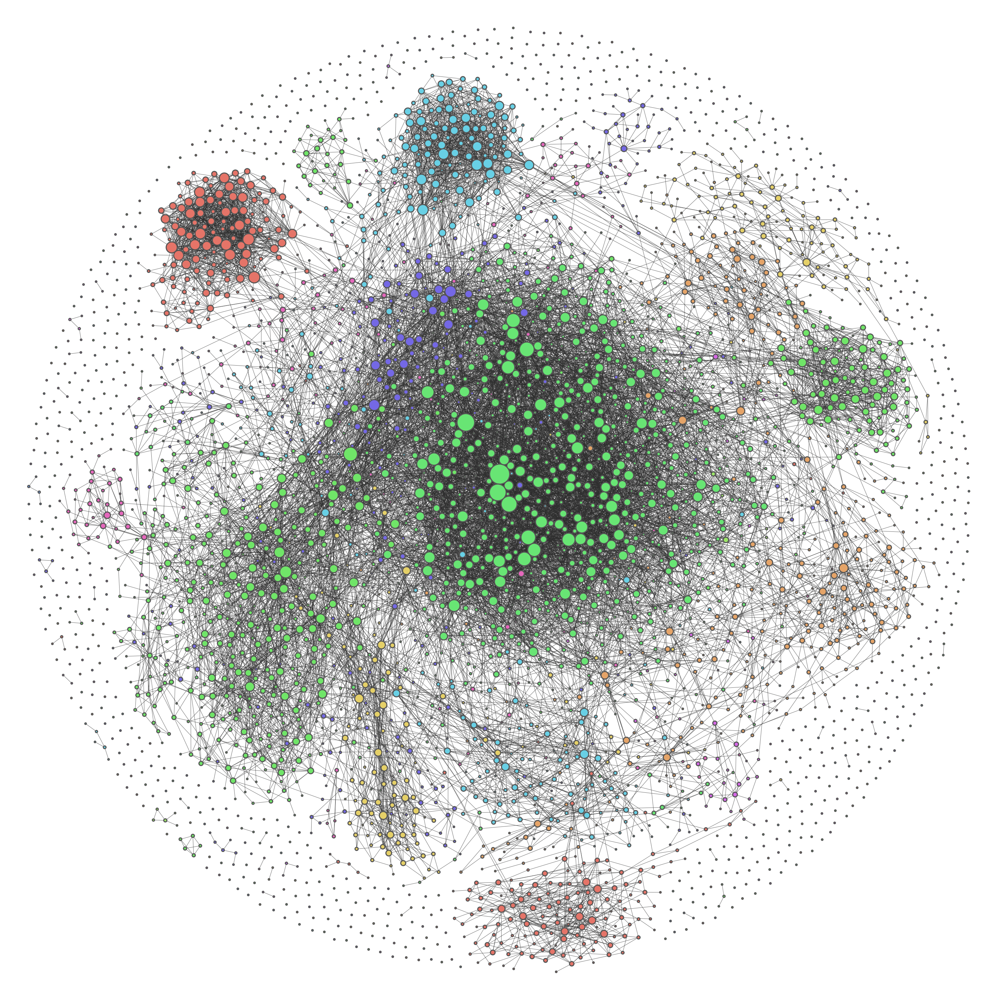

In [14]:
# Visualize pop network

run_netwulf = False # Convience functionality allowing the notebook to be run from top to bottom. If False, Netwulf is not run and an image is simply shown.
                    # Change to True to run Netwulf

if run_netwulf:
    from Netwulf_plot_functions import netwulf_plot_communities
    from community import community_louvain 

    communities = community_louvain.best_partition(G_pop)

    colors = ['#e57468', '#68e574', '#7468e5', '#e5d068', '#68d0e5', '#d468e5', '#e568bc', '#6898e5', '#e5a468', '#68e5a4', '#c068e5']    

    netwulf_plot_communities(G_pop, communities, color_palette=colors, path="Pop_network.pdf",zoom=0.76)

if run_netwulf == False:
    from IPython.display import Image, display

    display(Image('Pop_network.png'))

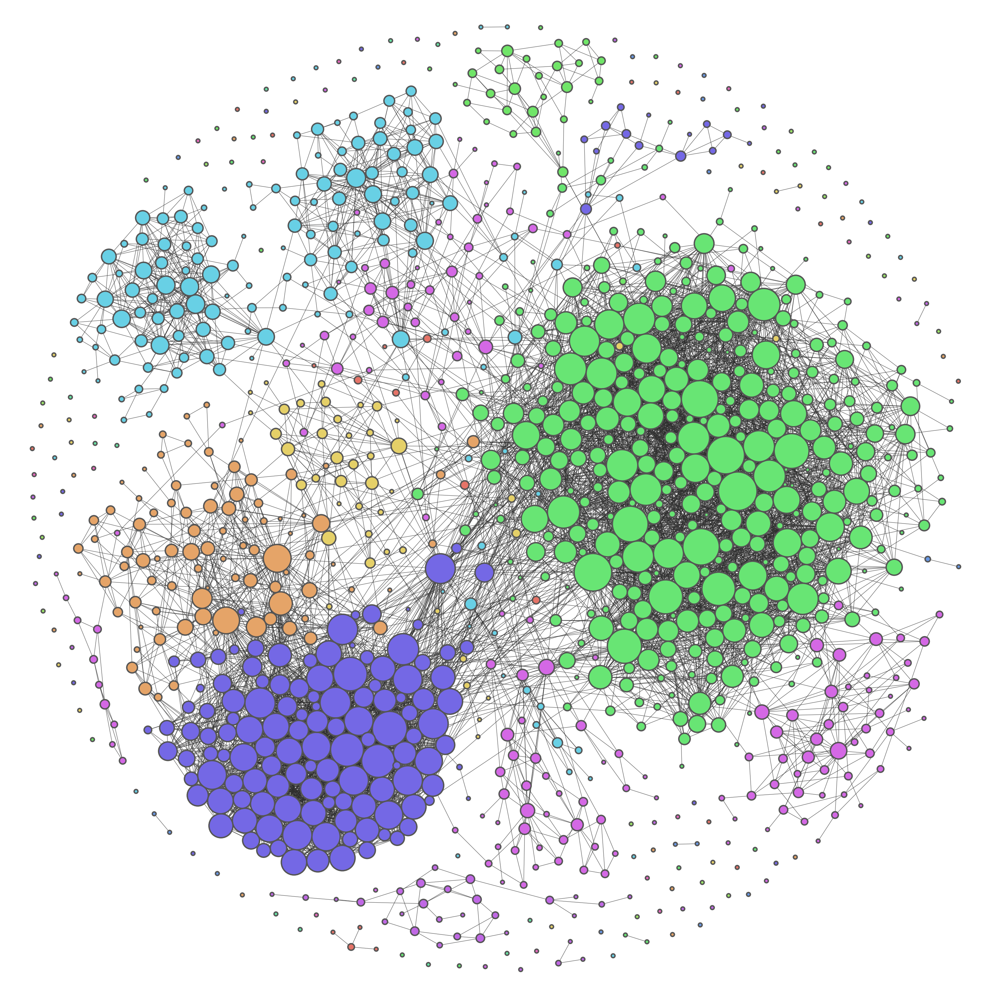

In [15]:
# Visualize rap network

run_netwulf = False # Convience of running the notebook from top op bottom, Netwulf is not run and an image is simply shown.
                    # Change to True to run Netwulf

if run_netwulf:
    from Netwulf_plot_functions import netwulf_plot_communities
    from community import community_louvain 

    communities = community_louvain.best_partition(G_rap)

    netwulf_plot_communities(G_rap, communities, path="Rap_network.pdf",zoom=1) # more zoom due a network of about 1/4th of the size

if run_netwulf == False:
    from IPython.display import Image, display

    display(Image('Rap_network.png'))

## Key statistics

Network statistics are printed to gain insights about the network.

In [16]:
from Network_statistics import print_network_statistics

In [17]:
print('Pop network statistics')
print_network_statistics(G_pop)

Pop network statistics


KeyboardInterrupt: 

In [ ]:
print('Rap network statistics')
print_network_statistics(G_rap)

Rap network statistics
Number of nodes: 1149
Number of edges: 6860
Density: 0.010401409497123692
Number of isolated nodes: 143
Is connected: False
Number of connected components: 153
Size of largest component: 961
Average shortest path length (largest component): 4.373501994450225
Average clustering coefficient: 0.2818015338203428
Transitivity (global clustering coefficient): 0.32168006480962175

Degree analysis
Average Degree: 11.94
Median Degree: 5.0
Mode Degree: 0
Minimum Degree: 0
Maximum Degree: 104


**Short comment on the dataset statistics**

The degree distributions of the pop and rap collaboration networks reveal noteworthy structural differences in how artists collaborate within each genre.

In the pop network, the average degree is 6.58, but the median is only 3 and the mode is 0, suggesting that while a few artists collaborate extensively, the majority are only loosely connected or not connected at all. This is confirmed by the high number of isolated nodes (758 out of 4161) and the fragmented structure with 801 components. The maximum degree of 162 indicates a small number of central pop artists with great influence, acting as hubs in an otherwise sparsely connected network.

In contrast, the rap network is noteably more cohesive. Despite being smaller in size, it shows a higher average degree of 11.94, and a median degree of 5, suggesting that rap artists tend to collaborate more frequently and more broadly than pop artists. The mode is still 0, and there are 143 isolated nodes, but this represents a smaller fraction of the total network compared to pop. The largest component in rap includes 961 out of 1149 nodes — over 80% of the network, which demonstrates a high level of connectivity. Additionally, the maximum degree of 104 still reflects the presence of a central artist as we saw in the pop network.

Overall, the pop network exhibits a more fragmented, with a large amount of disconnected or loosely connected nodes, while the rap network shows a tighter, more integrated structure, where collaboration is more widespread and balanced across the network.

**Top collaborators and an interpretation**

The top collaborators in both networks highlight interesting patterns. In pop, the most connected artists—R3HAB, David Guetta, Tiësto, Steve Aoki, and Diplo—are all prominent DJs and producers. This aligns with the structure of pop music, where producers often feature a wide range of vocal artists, leading to high collaboration counts.

In contrast, the rap network’s top collaborators: Gucci Mane, French Montana, Future, Young Thug, and Lil Wayne - are all vocal performers. This suggests that in rap, collaboration primarily occurs between performing artists themselves, further verifying the genre’s strong emphasis on features and collaborations.

## Plotting degree distributions

Degree distributions are visualized as well

In [ ]:
from Network_statistics import plot_degree_distribution

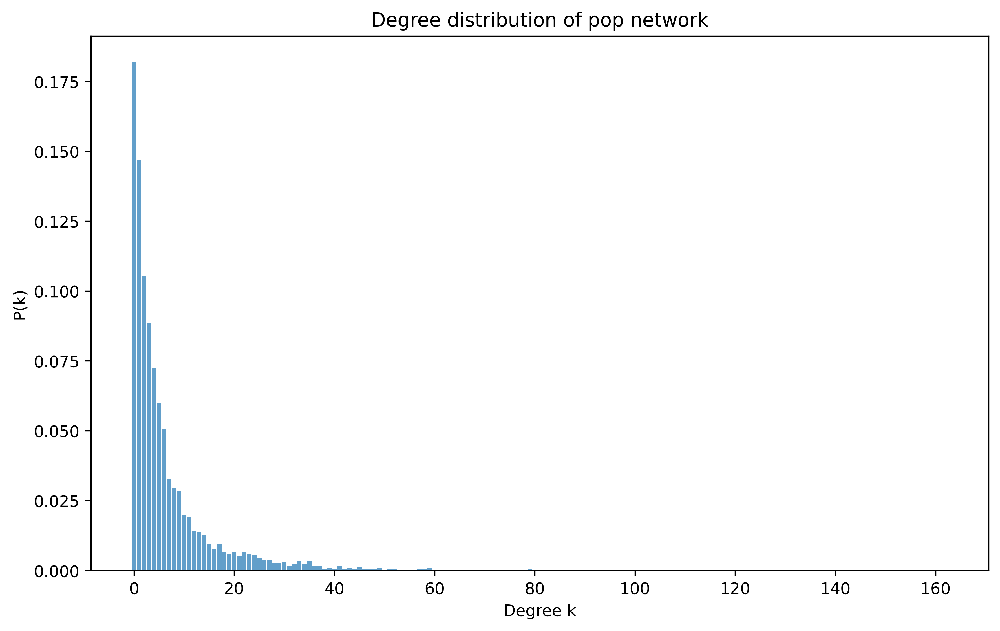

In [ ]:
plot_degree_distribution(G_pop)

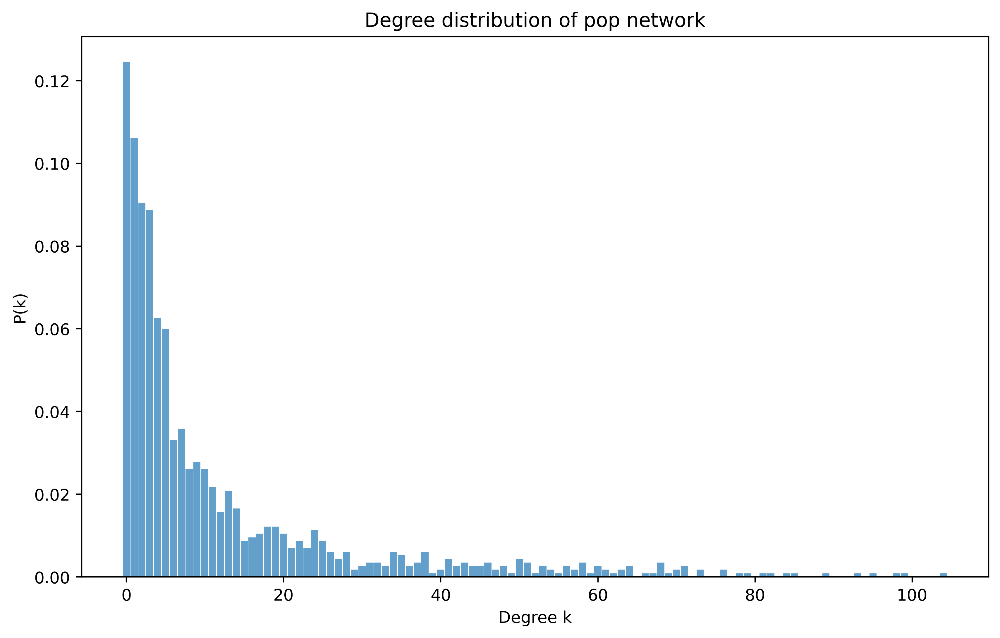

In [ ]:
plot_degree_distribution(G_rap)

The music genre-networks both seem to exhibit a Heavy-tailed distribution of degrees: there are few highly connected nodes. We will plot both in log-log scale as well.

In [ ]:
from Network_statistics import plot_degree_distribution_log_log_scale

Power-law exponent: 1.913


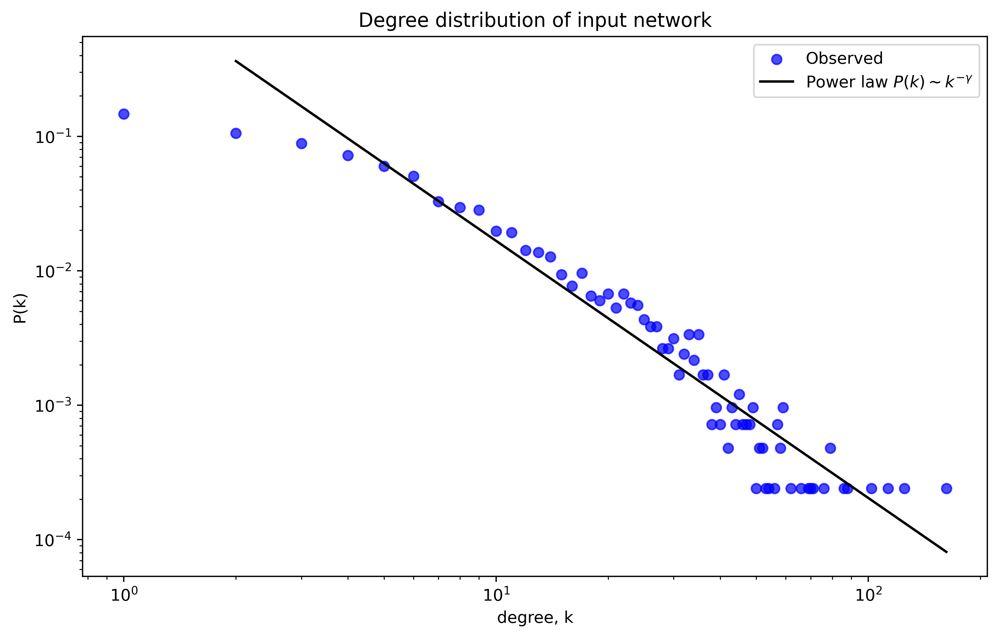

In [ ]:
plot_degree_distribution_log_log_scale(G_pop)

Power-law exponent: 1.380


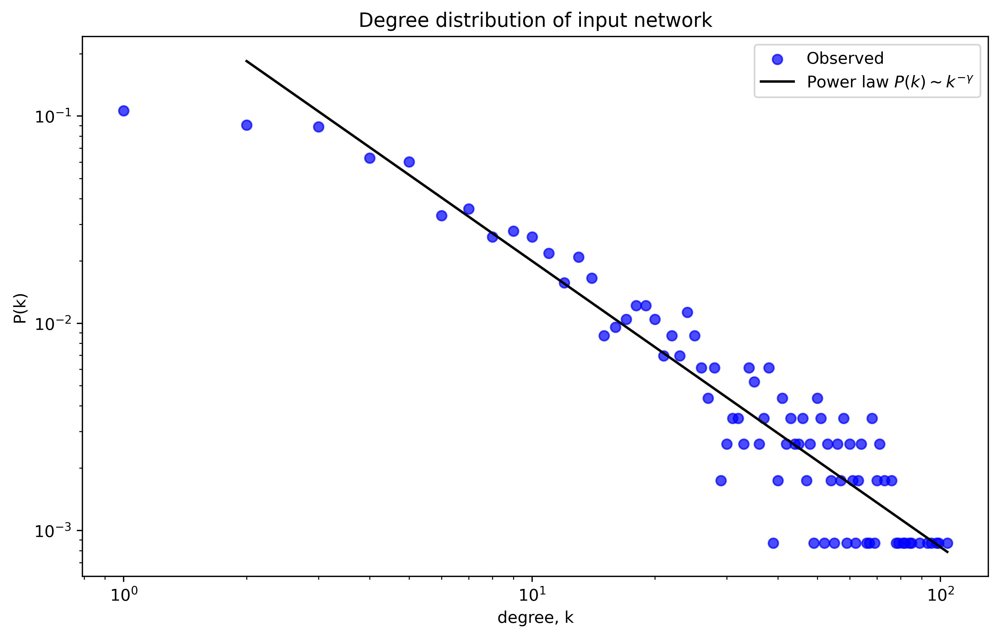

In [ ]:
plot_degree_distribution_log_log_scale(G_rap)

Our pop Network seem to follow the power-law correlation relative well, with a power-law exponent of 1.913, slightly below the typical 2-3 range for scale-free networks. This indicates our network has a heavy-tailed degree distribution, consistent with many real-world networks where most nodes have few connections while a small number of nodes have many connections.

In comparison, the rap network has a lower power-law exponent of 1.38, indicating an even more skewed distribution. This implies that collaboration in rap is even more heavily concentrated among a few central artists. This suggests a small number of artists drive a large share of the collaborations.

## Investigating Community Nationalities


We hypothesize that most communities primarily consist of artists from the same or neighboring countries. To explore this, we aim to categorize each community by its dominant nationality. This would allow us to narrow our analysis and focus more deeply on specific regional clusters.

To facilitate this, we implement a function that assigns nationalities to communities based on the distribution of artists' countries of origin.

In [ ]:
from utilities.top_community_countries import print_top_community_country_distribution
print("Top 5 POP Communities by Size and Their Country Composition:")
print_top_community_country_distribution(G_pop, artists_us_df)

Top 5 POP Communities by Size and Their Country Composition:
Community 1 (953 artists): US (28%), nan (22%), GB (15%), SE (5%), AU (4%), NL (3%), CA (3%), DE (3%), FR (2%), NO (2%), BE (1%), JP (1%), KR (1%), NZ (1%), IT (1%), IE (1%), DK (1%), JM (1%), ES (0%), RU (0%), EE (0%), PL (0%), BR (0%), IL (0%), CN (0%), PR (0%), LT (0%), RO (0%), IS (0%), CH (0%), MX (0%), FI (0%), VG (0%), AT (0%), GH (0%), TR (0%), AR (0%), GR (0%), AG (0%), XK (0%), CL (0%), CO (0%), TW (0%), NG (0%), MY (0%), ZA (0%), SN (0%), ID (0%), BA (0%), MA (0%), BF (0%), SI (0%)
Community 6 (388 artists): ES (22%), nan (15%), CO (11%), MX (10%), US (8%), DO (4%), PR (4%), AR (3%), VE (3%), PE (3%), IT (2%), CA (2%), PA (2%), CL (2%), GB (2%), FR (2%), BR (1%), JP (1%), DE (1%), KR (1%), UY (1%), CU (1%), GT (1%), NL (0%), HU (0%), AT (0%), HN (0%), TR (0%), NI (0%), GR (0%), CZ (0%), NO (0%), PL (0%), SE (0%), ZA (0%)
Community 9 (333 artists): SE (35%), nan (25%), DK (18%), NO (13%), US (3%), GB (2%), DE (2%), 

In the pop network, the largest community is dominated by U.S. artists, followed by a Spanish-speaking community, then a Scandinavian one, an Asian community, and finally a dutch one.



In [ ]:
print("Top 5 Rap Communities by Size and Their Country Composition:")
print_top_community_country_distribution(G_rap, artists_us_df)

Top 5 Rap Communities by Size and Their Country Composition:
Community 1 (349 artists): US (54%), nan (38%), CA (2%), GB (1%), JP (1%), NL (1%), JM (1%), IT (1%), AT (0%), SE (0%), FR (0%), ZA (0%), AR (0%), SK (0%), KR (0%), CM (0%), PR (0%), AU (0%)
Community 2 (191 artists): PR (35%), nan (28%), AR (7%), DO (5%), ES (5%), US (4%), CO (3%), CL (2%), GB (2%), MX (2%), CH (1%), BR (1%), DE (1%), JM (1%), RU (1%), PA (1%), LV (1%), CA (1%), BE (1%), VE (1%), NL (1%)
Community 0 (88 artists): DE (38%), nan (36%), TR (20%), US (2%), FR (1%), NL (1%), JP (1%)
Community 8 (78 artists): nan (46%), PL (36%), DE (5%), NL (4%), CZ (3%), US (3%), JP (1%), SK (1%), HU (1%)
Community 4 (65 artists): nan (42%), IT (40%), US (6%), GB (6%), CA (2%), JP (2%), FR (2%), PR (2%)


In the rap network, the largest community is again centered around U.S. artists, followed by a Portuguese-speaking group, a German community, while the fourth is mainly polish artists and the fifth communitiy is primarily italian artists.

## Zooming in on North America

Up until now we've considered the network and its communities across countries as an entirety. Therefore, to go more in depth with our network analysis, we zoom in on the North American cluster in both graphs.

This allows us to engage in a more focused network analysis, where country doesn't serve as a confounder for the communities. To do this we locate the corresponding North American clusters in the networks. 


In [18]:
from utilities.Network_construction_functions import get_community_subgraph
from utilities.network_analysis import stats_checker, run_parallel, degree_assortativity, modularity, plot_significance 

G_rap_communities = community_louvain.best_partition(G_rap, random_state=10)
counts = Counter(G_rap_communities.values())
most_common_community = counts.most_common(1)[0][0]

G_rap_NA = get_community_subgraph(G_rap, most_common_community, G_rap_communities)
G_rap_NA_communities = community_louvain.best_partition(G_rap_NA, random_state=10)

G_pop_communities = community_louvain.best_partition(G_pop, random_state=10)

counts = Counter(G_pop_communities.values())
most_common_community = counts.most_common(1)[0][0]

G_pop_NA = get_community_subgraph(G_pop, most_common_community, G_pop_communities)
G_pop_NA_communities = community_louvain.best_partition(G_pop_NA, random_state=10)

## Analyzing the North American networks

To start our network analysis we compare number of nodes and average node degree, to determine how to proceed with the network analysis

In [ ]:
stats_checker(G_rap_NA, "RAP")
stats_checker(G_pop_NA, "POP")

RAP-graph number of nodes: 345   and average node degree of 19.03768115942029
POP-graph number of nodes: 810   and average node degree of 10.824691358024692


This plays an important role in our network analysis, since we cannot directly compare metrics such as modularity which is very much dependent on the internal network structure. 

Instead we focus our analysis on comparing with random null models made with our double-edge-swap algorithm from week 6. For our network analysis we will examine modularity, degree assortativity and how degre and the attribute "popularity" correlate

We create a 1000 random graphs for both networks:

In [ ]:
pop_rnd_networks = []
rap_rnd_networks = []

if False: 
    for i in range(126): 
        pop_rnd_networks += run_parallel(G_pop_NA)
        print(i)
    for i in range(126): 
        rap_rnd_networks += run_parallel(G_rap_NA)
        print(i)
else: 
    with open("1000random_networks_POP.pkl", "rb") as f: 
        pop_rnd_networks = pickle.load(f)
    with open("1000random_networks_RAP.pkl", "rb") as f: 
        rap_rnd_networks = pickle.load(f)

### Modularity

We compute the modularity based on communities created by the louvain algorithm. 

In [ ]:
## POP 
p_community = community_louvain.best_partition(G_pop_NA)
p_mod = modularity(G_pop_NA, p_community)

p_mods = []
for g in pop_rnd_networks: 
    community = community_louvain.best_partition(g)
    p_mods.append(modularity(g, community))


## RAP 
r_community = community_louvain.best_partition(G_rap_NA)
r_mod = modularity(G_rap_NA, r_community)

r_mods = []
for g in rap_rnd_networks: 
    community = community_louvain.best_partition(g)
    r_mods.append(modularity(g, community))

print(f"Modularity of POP: {p_mod}, and the average of null models: {np.mean(p_mods)}")
print(f"Modularity of RAP: {r_mod}, and the average of null models: {np.mean(r_mods)}")

plot_significance(p_mods, p_mod, metric_type="Modularity", genre="POP", xrange=(0.2,0.35), color="orange")
plot_significance(r_mods, r_mod, metric_type="Modularity", genre="RAP", xrange=(0.15,0.35), color="red")

KeyboardInterrupt: 

Both POP and RAP collaboration networks exhibit clear community structures as indicated by the modularity scores significantly higher than those of their repsective null models. While POP shows slightly higher modularity than RAP, direct comparison is difficult due to the differences in number of nodes and average node degree. 

What can be confidently concluded is that both genres are characterized by meaningful community structures, suggesting that artists tend to cluster into collaboration groups, whether based on label, style or "crew"

### Assortatiity

In [ ]:
p_assort = degree_assortativity(G_pop_NA)
p_assorts = [degree_assortativity(g) for g in pop_rnd_networks]

r_assort = degree_assortativity(G_rap_NA)
r_assorts = [degree_assortativity(g) for g in rap_rnd_networks]

print(f"Degree assortativity of POP: {p_assort}, and the average of null models: {np.mean(p_assorts)}")
print(f"Degree assortativity of RAP: {r_assort}, and the average of null models: {np.mean(r_assorts)}")
plot_significance(p_assorts, p_assort, metric_type="Assortativity", genre="POP", xrange=(-0.2,0.1), color="orange")
plot_significance(r_assorts, r_assort, metric_type="Assortativity", genre="RAP", xrange=(-0.2,0.1), color="red")

While both genres show significantly less degree dissortativity when compared to random, it is still relatively low. This could reflect the nature of music collaborations, where highly active artists often collaborate with less connected ones, often seen where artists collaborate with new upcoming artists. This correlates well with our two networks degree distributions following a power law. 

Assortativity by attribute "popularity" was also computed, which did not showing a significant difference. However, this inspired us to look into how the "popularity" attribute correlates with node-degree count. 

In [ ]:
import scipy.stats as stats
G = G_pop_NA
degrees = [G.degree[n] for n in G.nodes]
popularities = [G.nodes[n]['popularity'] for n in G.nodes]
corr, _ = stats.pearsonr(degrees, popularities)
print("POP correlation between popularity and out-degree", corr)

G = G_rap_NA
degrees = [G.degree[n] for n in G.nodes]
popularities = [G.nodes[n]['popularity'] for n in G.nodes]
corr, _ = stats.pearsonr(degrees, popularities)
print("RAP correlation between popularity and out-degree", corr)

Both POP and RAP show some correlation between popularity and out-degree. However, there is a higher correlation between the two metrics in the RAP network, ie. popularity is more tied to number of collaborations, suggesting that popularity might be more network driven in the RAP genre. In the POP network the correlation is weaker, which could imply that popularity may be more dependent on external factors, such as marketing, labels or solo success, rather than collaborations.

## Text gathering

While the networks provided relevant and interesting analytical points, we seek to further expand our analysis by investigating the semantic differences across the genres. 

Since our data doesn't include any artists lyrical data, we decided to gather additional data and further expand our dataset. Researching methods led us to discover the Genius API - geniuslyrics, which allowed us to fetch each artists top 3 songs. 

In [ ]:
import lyricsgenius
import concurrent.futures 

token = "SQ5PQucPjwa_LEDaobBQyxewdh80ZB-KhaBau73yASMRNIvnijWprQSi6ZDnUb7N"
genius = lyricsgenius.Genius(token, verbose=False)

During initial testing of the geniuslyrics library we discovered that each request runs slowly leading us to implement our own search function coupled with a parallel running method. This allowed us to speed up the data gathering, but this still showed to be a long and tedious process.

In [ ]:
def search_artists_songs(artist_name): 
    try:
        dic = {"name": artist_name, "lyrics": []}
        result = genius.search_artist(artist_name, max_songs=3, sort="popularity")
        for song in result.songs: 
            dic["lyrics"].append(song.lyrics)
        print("#")
        return dic
    
    except Exception as e:
        print(f"Error fetching artist {artist_name}: {e}")
        return None

def parallel(chosen_list): 
    #Parallel implementation
    for i in range(0, len(chosen_list), 5): 
        print(f"Batch {i//5 + 1} / {len(chosen_list)//5}")

        if i != 0:
            print(f"{(i/5)} / {len(chosen_list)/5 -1}")
        names = chosen_list[i:i+5]

        with concurrent.futures.ThreadPoolExecutor() as executor: 
            tmp = list(executor.map(search_artists_songs, names))
        results += tmp

    df = pd.DataFrame(results)

    with open("Missing1.pkl", "wb") as f: 
        pickle.dump(df, f)
    return df

Selecting all artists names for lyrics gathering

In [ ]:
names = pop_df["name"] + rap_df["name"]
print("Total number of artists for lyrics gathering", len(names))

In [ ]:
results = []
#parallel(chosen_list)
all_lyricsdf = pd.read_csv("all_lyrics.csv") #Loading manually since computing this will take many hours otherwise

During gathering of the lyrics some duplicates seemed to appear, so to handle this we carefully dropped duplicates, always choosing the entry with longest set of lyrics.  

In [ ]:
def remove_duplicates_keep_longest_lyrics(df):
    # Drop rows with missing lyrics or name
    df = df.dropna(subset=["name", "lyrics"]).copy()

    # Compute length of lyrics
    df["lyrics_length"] = df["lyrics"].apply(len)

    # Sort by name and lyrics_length descending
    df_sorted = df.sort_values(by=["name", "lyrics_length"], ascending=[True, False])

    # Drop duplicates, keeping the one with the longest lyrics
    df_deduped = df_sorted.drop_duplicates(subset="name", keep="first")

    # Drop the helper column
    df_deduped = df_deduped.drop(columns="lyrics_length")

    return df_deduped

all_lyricsdf = pd.read_csv("all_lyrics.csv")

lyrics_df = remove_duplicates_keep_longest_lyrics(all_lyricsdf)

lyrics_df.head(5)

# Text analysis

The following section implements and applies all necessary steps for WordClouds using TF-IDF on a graph of artists. It outlines and explains how the process is done with reasoning.

### Introduction of TF-IDF

TF calculates the fraction of a term in a document.

$$TF(t,d) = \frac{f_{t,d}}{\sum_{t' \in d}(f_{t',d})}$$

where $f_{t,d}$ is the count of term $t$ in document $d$.

IDF is calculated as

$$
\text{IDF}(t, d) = \log \left( \frac{N}{\left| \left\{ d \in D \mid t \in d \right\} \right|} \right)
$$

where N is the count of documents in the entire corpus. and $ \left\{ d \in D \mid t \in d \right\} $ is the set of documents containing term t. $\left| \left\{ d \in D \mid t \in d \right\} \right|$ is then the count of documents containing the term t. Summarized IDF returns the log inverse fraction of documents containing the term t in the corpus D.

Combined as the product of the two they give the TF-IDF

$$TFIDF(t,d,D) = tf(t,d)\cdot idf(t,D)$$

This function combines a terms importance within a single document (its internal representation) with its overall significance across the corpus.

### Preprocessing of Lyrics Data

- Artists with empty lyrics are kept in the communities however they do not contribute with any lyrics to the representative text of a community, as these represent artists whose lyrics could not be fetched via the Genius API. However, using only lyrics of the remaining artists will prove to be sufficient.

- The `clean_lyrics_and_apply_representative_text` function combines all lyrics for each each artist into a single, semantically representative string, that represents the artist's song style.

The text is cleaned in the following ways:
- Removes metadata such as `"Read More\xa0\n"` and the first line (often the title).
- Strips structural tags like `[Verse]`, `[Chorus]`, etc.
- Removes quoted commentary at the beginning of the lyrics.
- Filters out non-letter characters, leaving only alphabetic characters and whitespace.
- Cleans escaped characters (`\n`, `\r`) 
- Removes all whitespace.
- Converts the text to lowercase.

This results in a clean, lowercase string for each artist, ready for semantic analysis.

### Tokenization of Representative Lyrics

After cleaning the lyrics, each artist’s representative text is transformed into a list of tokens through the following process:

- **Stemming and Stopword Removal**: Words are reduced to their stems using a Snowball stemmer. Common English and domain-specific stopwords (e.g., "lyrics", "chorus") are removed.
- **Bigram Detection**: Frequent word pairs (bigrams) are extracted using the chi-squared statistic. Only pairs occurring more than 50 times and with p-value < 0.001 are kept.
- **Retokenization**: Statistically significant bigrams are merged into single tokens using an MWETokenizer for example "hip_hop".

The result is a structured token representation of each artist that can be used for analysis such as TF-IDF and WordClouds.


#### Gathering Data For Text Analysis

Before beginning preprocessing we will first retrieve the dataframes necessary for the task at hand.

In [ ]:
print("---------- Cleaned Nodes Dataframe ----------")

display(final_cleaned_nodes_df.head(2))

print("---------- Lyrics Dataframe ----------")

display(lyrics_df.head(2))


Merging the Cleaned Nodes Dataframe and Lyrics Dataframe we obtain the dataframe necessary, called `artists_with_lyrics`.

In [ ]:
artists_with_lyrics = pd.merge(lyrics_df, final_cleaned_nodes_df, on='name', how='inner') 
artists_with_lyrics["lyrics"] = artists_with_lyrics["lyrics"].apply(ast.literal_eval)

print(f"{len(artists_with_lyrics)} artists remain in the final cleaned subset with lyrics.")

artists_with_lyrics.head(2)

Recall the we are going to perform text analysis on the subgraphs for North America.

`G_rap_NA` and `G_pop_NA`

In [ ]:
print(f"The North American rap graph contains {len(G_rap_NA)} nodes.")
print(f"The North American pop graph contains {len(G_pop_NA)} nodes.")

In [ ]:
from utilities.text_analysis import clean_lyrics_and_apply_representative_text, filter_for_english_language, tokenize

### Running Procedure on Rap subgraph for North America

In the following code block the lyrics extraction and tokenization as previously described is executed for the `G_rap_NA`

In [ ]:
rap_artists_df = artists_with_lyrics.copy()
rap_artists_df_prepared = rap_artists_df.copy()

amounts_of_artists_with_lyrics = 0
artist_names = set(rap_artists_df_prepared["name"])

for node in G_rap_NA.nodes():
    if node in artist_names:
        amounts_of_artists_with_lyrics += 1

print(f"{amounts_of_artists_with_lyrics} out of {len(G_rap.nodes())} artists in the North American rap graph have lyrics available.")

rap_artists_df_prepared = clean_lyrics_and_apply_representative_text(rap_artists_df_prepared)
rap_artists_df_prepared  = tokenize(rap_artists_df_prepared)

rap_artists_df_prepared.head(2)

### Community-Based TF-IDF Analysis and WordCloud Visualization

This analysis explores linguistic patterns across artist communities using TF-IDF scores to extract key terms for each group and visualise them through word clouds. The process involves grouping, transforming, and analysing preprocessed lyrics data.

The following code block imports necessary functions from the utillities module. Most importantly:
`prepare_community_texts`, `get_TF_dataframe`, `get_IDF_dataframe`, `get_TF_IDF_dataframe`

Which all play part in preparing the use of `plot_wordcloud`

In [ ]:
from utilities.text_analysis import prepare_community_texts, get_top_n_largest_community_ids, get_TF_dataframe

from utilities.text_analysis import get_IDF_dataframe,get_TF_IDF_dataframe,print_top_5_TF_per_community,print_top_10_tf_idf_tokens

from utilities.text_analysis import  get_community_to_top_n_artists_by_followers, plot_wordcloud, run_tf_idf_wordcloud_analysis

#### 1. Grouping Lyrics by Community

We begin by aggregating tokenized lyrics at the **community level** using the `prepare_community_texts()` function:

Next, we extract the top 5 largest communities, where "largest" is defined by the number of artists assigned to each community.

In [ ]:
community_counts = Counter(G_rap_NA_communities.values())

print(f"{len(community_counts)} unique communities were identified in the G_rap_NA network.")

rap_community_texts_df = prepare_community_texts(rap_artists_df_prepared, G_rap_NA_communities)

rap_top_5_community_ids = get_top_n_largest_community_ids(G_rap_NA_communities, 5)

rap_top_5_community_texts_df = rap_community_texts_df[rap_community_texts_df["community"].isin(rap_top_5_community_ids)]

rap_top_5_community_texts_df = rap_top_5_community_texts_df.sort_values(
    by="community",
    key=lambda col: col.map({cid: i for i, cid in enumerate(rap_top_5_community_ids)})
)

rap_top_5_community_texts_df["community_size"] = rap_top_5_community_texts_df["community"].map(community_counts)

print("Top 5 communities ranked by member count")

rap_top_5_community_texts_df

#### 2. Calculating TF, IDF, and TF-IDF Scores

With the top 5 communities selected, we now calculate word importance within and across communities using Term Frequency (TF), Inverse Document Frequency (IDF), and TF-IDF scores.


In [ ]:
rap_tf_df = get_TF_dataframe(rap_top_5_community_texts_df)
rap_idf_df = get_IDF_dataframe(rap_community_texts_df)
rap_TF_IDF_df = get_TF_IDF_dataframe(rap_tf_df, rap_idf_df)

print("--- Top 5 terms in rap communities based on Term Frequency (TF) ---")
print_top_5_TF_per_community(rap_tf_df)

print("--- Top 5 terms in rap communities based on Term Frequency-Inverse Document Frequency (TF-IDF) ---")
print_top_10_tf_idf_tokens(rap_TF_IDF_df)


#### 3. Identifying Top Artists per Community

To make the wordcloud plots more informative we identify the **top artists by followers** in each of the 5 selected communities.

In [ ]:
n=10

rap_communitiy_to_top_artists = get_community_to_top_n_artists_by_followers(rap_top_5_community_ids, G_rap_NA_communities, rap_artists_df, n)

for community_id, top_artists in rap_communitiy_to_top_artists.items():
    print(f"Top {n} most-followed artists in community {community_id}: {', '.join(top_artists)}")

#### 4. Visualising Community-Specific Language with Word Clouds

In the final step, we generate a **word cloud** for each of the top 5 communities using their most distinctive terms determined by TF-IDF scores.

In [ ]:
rap_communitiy_to_top_3_artists = get_community_to_top_n_artists_by_followers(rap_top_5_community_ids, G_rap_NA_communities, rap_artists_df, 3)

plot_wordcloud(rap_TF_IDF_df, rap_top_5_community_texts_df, rap_communitiy_to_top_3_artists)

### Running Procedure on Pop subgraph for North America

In the following code block the same procedure is executed for `G_pop_NA`, wrapped into a single run function to avoid redundance.

In [ ]:
run_tf_idf_wordcloud_analysis(artists_with_lyrics, G_pop_NA, G_pop_NA_communities)

### Intepretting text analysis results

When looking across the most important words determined by the Term Frequency it becomes apparant that slang and profanity is heavily used.

Which is different when looking across the pop communities. Here words such as "like", "i" "love" are used.

That corresponds with established expectations.

Now when looking over the rap cultures we see.

xx

xx

xx

When looking over the pop cultures we see.

yy

yy

yy

yy